# Fit ellipses

## Imports

In [1]:
# Python standard library
import sys
import csv
import os
import importlib 
# Scientific computing

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy.ndimage
import sklearn.mixture

#plt.rc('text', usetex=True)
plt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

# Program specific
PORE_STATS_BASE_DIRECTORY = os.getcwd().replace('notebooks', 'repo')
sys.path.append(PORE_STATS_BASE_DIRECTORY)


import optical_imaging as oi
import oi_file
import image_processing

%load_ext autoreload
%autoreload 2

## Load data

In [2]:
# Define file path
data_base_path = oi_file.data_base_path
date = '12-10-19'
particle_type = '/PA1'
channel_type = '/8x150'
file_index = '0'


file_path = data_base_path + date + particle_type + channel_type + '/oi/'+ file_index+ '/bin/test_camera_0.raw'

#file_path = data_base_path + date + particle_type + channel_type + '/oi/'+ file_index+ '/bin/frames/' +'frames.txt'

# Set output file path
oi_events_file_path = data_base_path + date + particle_type + channel_type + '/oi/' + file_index + '/events/test_camera_0' + '_events.json'

# Open video
res_x = 880
res_y = 180
fps = 8666
exp = 25
camera = 0 

## camera = 0 is raw 16bpp chronos
oi_vid = oi_file.Video(file_path, res_x, res_y, fps, exp,camera=camera)

# Load events
oi_events = oi_file.open_event_file_json(oi_events_file_path)

print 'loaded', len(oi_events), 'oi events'

loaded 23 oi events


In [3]:
def plot_frame(frame, show = True):
    plt.imshow(frame, cmap = 'gray', origin = 'lower', interpolation = 'none',vmin=0,vmax=frame.max())
    if show:
        plt.show()
    
def plot_processed_over_raw(processed_frame, frame, show = True):
    green_processed_frame = np.zeros((processed_frame.shape[0], processed_frame.shape[1], 3))
    green_processed_frame[:,:,1] = processed_frame

    plt.imshow(frame, cmap = 'gray', origin = 'lower', alpha = 1, interpolation = 'none')
    plt.imshow(green_processed_frame, cmap = 'gray', origin = 'lower', alpha = 0.15, interpolation = 'none')

    if show:
        plt.show()
    
def plot_frame_hist(frame, show = True):
    plt.hist(frame.flatten(), facecolor = 'k', bins = 100)
    
    if show:
        plt.show()
    
def plot_all(processed_frame, frame):
    fig, axes = plt.subplots(1,3,figsize = (12,3))
    
    # Plot 1
    plt.sca(axes[0])
    plot_frame(processed_frame, show = False)
    
    
    # Plot 2
    plt.sca(axes[1])
    plot_processed_over_raw(processed_frame, frame, show = False)
    
    # Plot 3
    plt.sca(axes[2])
    plot_frame_hist(processed_frame, show = False)
    
    plt.show()

# Create stage

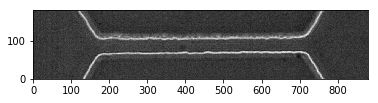

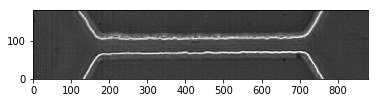

In [4]:
template_index = 200
template_frame = oi_vid.get_frame(template_index)
plot_frame(template_frame,(1,1))

num_avg = 10
template_frame_avg = np.zeros((res_y,res_x,num_avg))
for i in range(num_avg):
    template_frame_avg[:,:,i] = oi_vid.get_frame(template_index+i)

template_frame = template_frame_avg.mean(2)
plot_frame(template_frame,(1,1))

C:\Users\codyt\Documents\cell_data\data\12-10-19/PA1/8x150/oi/0/stage/stage_0.txt
[[170, 105], [170, 70], [715, 70], [715, 105]]
[-0.  1.]


C:\Users\codyt\Documents\cell_code\updated_code\pore_stats\repo\oi\optical_imaging.py:463: RuntimeWarning: divide by zero encountered in double_scalars
  plt.plot([x, x + image_height/(self._norm_y[1]/self._norm_y[0])], [0, image_height], ls = '--', color = 'yellow')


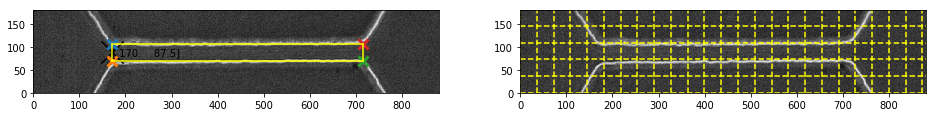

In [5]:
reload(oi)
template_index =10
template_frame = oi_vid.get_frame(template_index,camera=camera)
 
stage_file_path = data_base_path + date + particle_type + channel_type + '/oi/'+ file_index + '/stage/stage_0.txt' 
print stage_file_path
cs = oi.load_stage_file(stage_file_path)
print cs
c0 = cs[0]
c1 = cs[1]
c2 = cs[2]
c3 = cs[3]

oi_stage = oi.Stage(template_frame, c0, c1, c2, c3)
oi_stage._length_microns = 150
oi_stage.plot_stage()

In [11]:
def process_frame(frame, template_frame, detection, debug = False):
    
    processed_frame = np.copy(frame)
    processed_template_frame = np.copy(template_frame)
    
    # Crop
    function = crop_step['function']
    kwargs = crop_step['kwargs']            
    kwargs['x'] = detection._px
    kwargs['y'] = detection._py
    processed_frame = function(processed_frame, **kwargs)
    processed_template_frame = function(processed_template_frame, **kwargs)
    cropped_frame = np.copy(processed_frame)
    
    if debug:
        print function.__name__, kwargs
        #plot_all(processed_frame, cropped_frame)
    
    
    # Pre-negative steps
    for prenegative_step in prenegative_steps:
        function = prenegative_step['function']
        kwargs = prenegative_step['kwargs']
        
        processed_frame = function(processed_frame, **kwargs)
        processed_template_frame = function(processed_template_frame, **kwargs)
        
        if debug:
            print function.__name__, kwargs
            plot_all(processed_frame, cropped_frame)
        
    # Negative step
    function = negative_step['function']
    kwargs = negative_step['kwargs']
    processed_frame = function(processed_frame, processed_template_frame, **kwargs)
    
    if debug:
        print function.__name__, kwargs
        plot_all(processed_frame, cropped_frame)
        
    # Post-negative steps
    for postnegative_step in postnegative_steps:
        function = postnegative_step['function']
        kwargs = postnegative_step['kwargs']
        
        processed_frame = function(processed_frame, **kwargs)
        
        if debug:
            print function.__name__, kwargs
            plot_all(processed_frame, cropped_frame)
            
    return processed_frame
  
def fit_plot_ellipse(frame, processed_frame, crop_distance, detection, detection_index, debug = False):

    # Ellipse-fitting
    
    
    ellipse_pixels = np.where(processed_frame == 1)
        
    ellipse = oi.fit_ellipse_image_aligned(ellipse_pixels[1], ellipse_pixels[0])
    
    
    # Get ellipse parameters
    ellipse_x, ellipse_y = oi.get_ellipse_center(ellipse)
    ellipse_a, ellipse_b = oi.get_ellipse_axes_lengths(ellipse)
    ellipse_theta = oi.get_ellipse_angle(ellipse)
    
    cropped_frame = image_processing.crop_frame(frame, detection._px, detection._py, crop_distance)
    
    
    # Plot
    
    if debug:
        fig, axes = plt.subplots(1,3,figsize = (12,6))

        green_processed_frame = np.zeros((processed_frame.shape[0], processed_frame.shape[1], 3))
        green_processed_frame[:,:,1] = np.copy(processed_frame)
        




        fig.sca(axes[0])
        plt.imshow(cropped_frame, cmap = 'gray', origin = 'lower', interpolation = 'none')
        
        plt.xticks([])
        plt.yticks([])


        fig.sca(axes[1])
        plt.imshow(cropped_frame, interpolation = 'none', origin = 'lower', alpha = 1., cmap = 'gray')
        plt.imshow(green_processed_frame, interpolation = 'none', origin = 'lower', alpha = 0.5)
        
        plt.xticks([])
        plt.yticks([])

        fig.sca(axes[2])
        plt.imshow(cropped_frame, interpolation = 'none', origin = 'lower', alpha = 1., cmap = 'gray')
        plt.imshow(green_processed_frame, interpolation = 'none', origin = 'lower', alpha = 0.5)
        
        plt.xticks([])
        plt.yticks([])
        
        
        num_points = 100
        xs = []
        ys = []
        for i in range(num_points):
            angle = i*2*np.pi/99.
            temp_x = ellipse_a*np.cos(angle)
            temp_y = ellipse_b*np.sin(angle)
            xs.append(ellipse_x + np.cos(ellipse_theta)*temp_x + np.sin(ellipse_theta)*temp_y)
            ys.append(ellipse_y + np.sin(ellipse_theta)*temp_x - np.cos(ellipse_theta)*temp_y)
            
            
        plt.plot(xs, ys, ls = '--', c = 'white', lw = 1)
        
        plt.text(0, 1.0, 'a/b=' + str(round(ellipse_a/ellipse_b, 2)), transform = plt.gca().transAxes,\
                 color = 'white', fontweight = 'bold', size = 24, ha = 'left', va = 'top')
        
        plt.xlim(0, cropped_frame.shape[1] - 1)
        plt.ylim(0, cropped_frame.shape[0] - 1)
            
            


        plt.show()
    
    
    
    
    ellipse_x = ellipse_x + detection._px - crop_distance
    ellipse_y = ellipse_y + detection._py - crop_distance
    
    
    return [detection_index, ellipse_x, ellipse_y, ellipse_a, ellipse_b, ellipse_theta]
        
    
        

## Find event to test fit on

##### Frame

IndexError: list index out of range

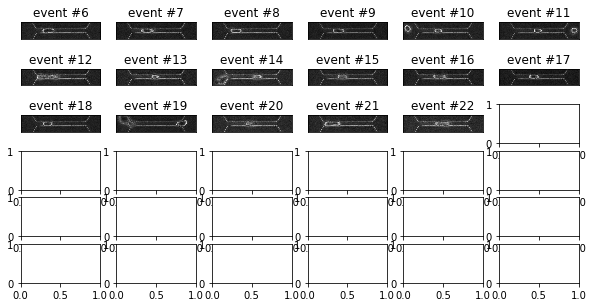

In [6]:
fig, axes = plt.subplots(6,6,figsize = (10,5))
start_index = 1*6

for i in range(36):
    oi_index = start_index + i
    oi_event = oi_events[oi_index]
    ts = oi_event.get_tf()
    t = int((ts[-1] + ts[0])/2.)
    frame = oi_vid.get_frame(t,camera=camera)
    
    
    row = i/6
    column = i%6
    plt.sca(axes[row, column])
    plt.imshow(frame, cmap = 'gray', origin = 'lower')
    plt.title('event #' + str(i + start_index))
    plt.xticks([])
    plt.yticks([])
plt.show()

## Define ellipse fitting functions

In [9]:
#reload(image_processing)
oi_index = 7
oi_event = oi_events[oi_index]

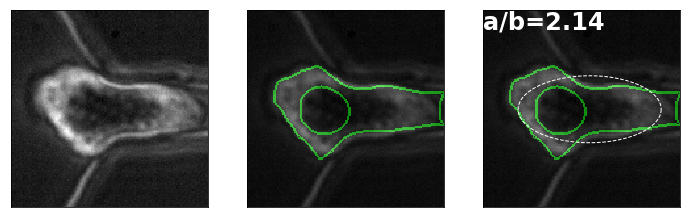

C:\Users\codyt\Documents\cell_code\updated_code\pore_stats\repo\oi\optical_imaging.py:622: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)


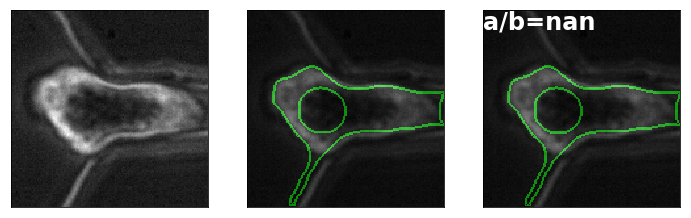

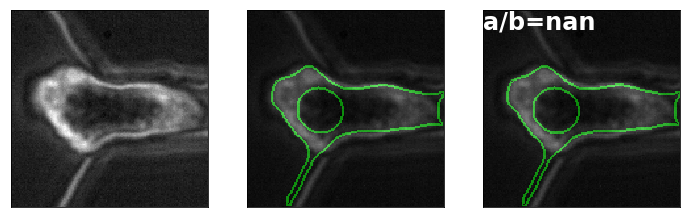

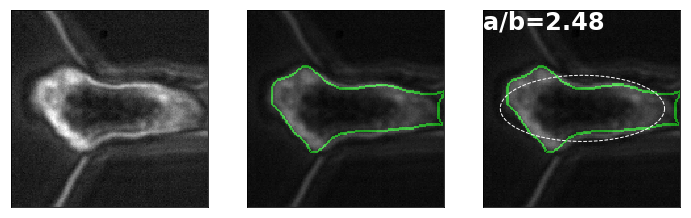

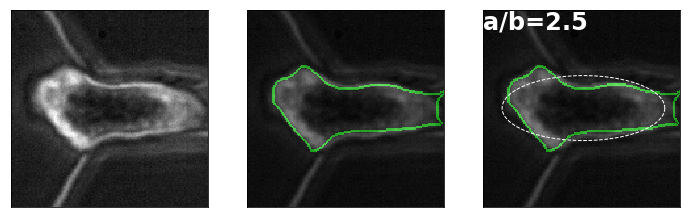

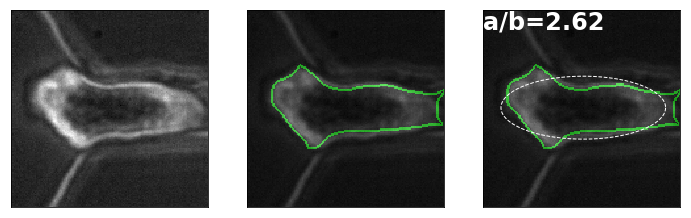

...

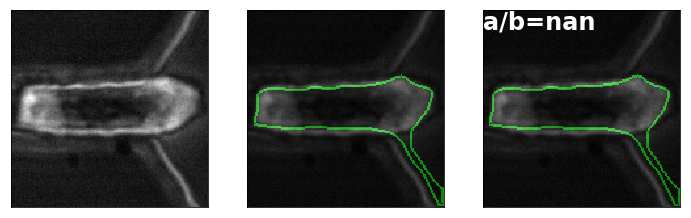

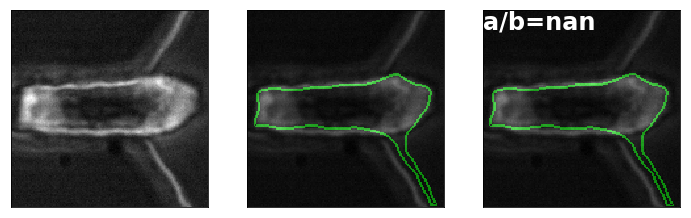

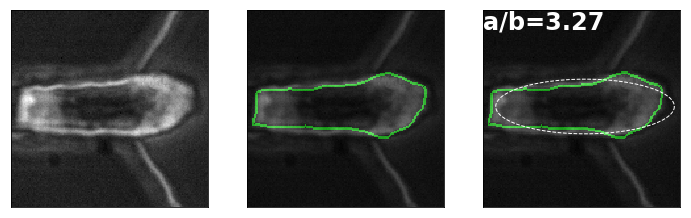

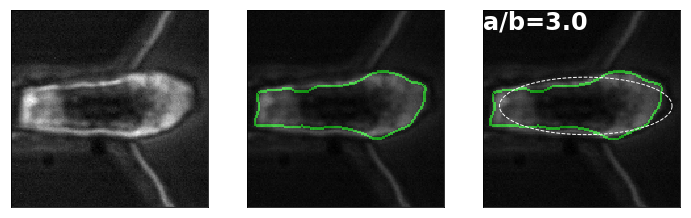

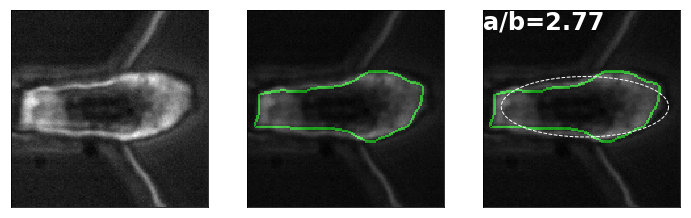

In [12]:
xc_left = 0
xc_right = 150
for j, detection in enumerate(oi_event._detections):
    try:
        x = int(detection._px)
        y = int(detection._py)
        xc, yc = oi_stage.get_channel_coordinates(x, y)
        xc = oi_stage.pixels_to_meters(xc)
        if xc >= xc_left and xc <= xc_right:

            tf = detection._tf
            
            frame = oi_vid.get_frame(tf,camera=camera)
            #template_frame = oi_vid.get_frame(template_index,camera=camera)

            crop_distance = 75
            crop_step = {'function': image_processing.crop_frame, 'kwargs': {'crop_distance': crop_distance}}
            
            prenegative_steps = []
            prenegative_steps.append({'function': image_processing.normalize, 'kwargs': {}})
            prenegative_steps.append({'function': image_processing.gaussian_blur, 'kwargs': {'blur_kernel': (15, 15)}})

            
            negative_step = {'function': image_processing.negative, 'kwargs': {'direction':'pos','block': 25}}


            postnegative_steps = []
            postnegative_steps.append({'function': image_processing.normalize, 'kwargs': {}})
            postnegative_steps.append({'function': image_processing.gradient, 'kwargs': {}})
            postnegative_steps.append({'function': image_processing.invert, 'kwargs': {}})
            postnegative_steps.append({'function': image_processing.gaussian_threshold, 'kwargs': {'sigma_multiplier':.3}})
            postnegative_steps.append({'function': image_processing.largest_cluster, 'kwargs': {}})
            postnegative_steps.append({'function': image_processing.threshold_clusters, 'kwargs': {'cluster_threshold': 30}})
            postnegative_steps.append({'function': image_processing.morphological_closing, 'kwargs': {'morph_kernel': (30,30)}})
            postnegative_steps.append({'function': image_processing.erodesubtract, 'kwargs': {'iterations':3}})

            processed_frame = process_frame(frame, template_frame, detection, debug = False)
            fit_plot_ellipse(frame, processed_frame, crop_distance, detection, j, debug = True)



        
    except:
        print 'failed on ', j, len(oi_event._detections)
        exc_type, exc_obj, exc_tb = sys.exc_info()
        fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
        print(exc_type, fname, exc_tb.tb_lineno)
        pass
    
        

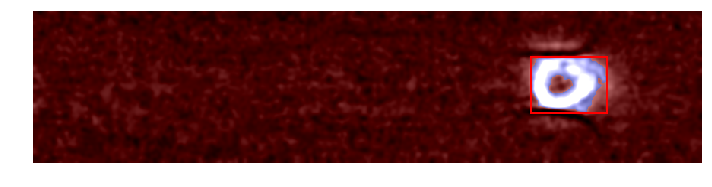

In [39]:
#reload(image_processing)
blur_kernel = (15,15)
template_index = 100
oi_index = 11
oi_event = oi_events[oi_index]

index = 80
tf=oi_event._detections[index]._tf
raw_frame = oi_vid.get_frame(tf,camera=camera)

template_frame = preprocess_frame(oi_vid.get_frame(template_index,camera=camera),blur_kernel)
frame = preprocess_frame(raw_frame,blur_kernel)

x = oi_event._detections[index]._px
y = oi_event._detections[index]._py

test_frame = frame - template_frame
thresh = threshold_otsu(test_frame)
bw = closing(test_frame>thresh,square(3))

cleared = clear_border(bw)
label_image = label(cleared,connectivity=2)
image_label_overlay = label2rgb(label_image,image=test_frame)

#cnts, hierarchy= cv2.findContours(bw*1,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)

for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 100:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

ax.set_axis_off()
plt.tight_layout()
plt.show()

https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_label.html

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(16,8))

# Raw image
plt.sca(axes[0,0])
plt.imshow(frame, cmap = 'gray', origin = 'lower')


# Negative
plt.sca(axes[0,1])
plt.imshow(neg_frame, cmap = 'gray', origin = 'lower')



# Thresholded negative
plt.sca(axes[1,0])
plt.imshow(temp_neg_frame, vmin = 0, vmax = 1, cmap = 'gray', origin = 'lower')

# Color frame
color_frame = np.zeros((frame.shape[0], frame.shape[1], 3))
for cluster in clusters:
    rand_color = [np.random.rand(), np.random.rand(), np.random.rand()]
    for pixel in cluster:
        color_frame[pixel[0], pixel[1],:] = rand_color

plt.sca(axes[1,1])
plt.imshow(raw_frame, cmap = 'gray', origin = 'lower')
plt.imshow(color_frame, alpha = 0.55, origin = 'lower')


plt.show()

## Save fit

In [14]:
def out_of_bounds(detection):
    x_min = 20
    x_max = res_x - 20
    
    y_min = 20
    y_max = res_y - 20
    
    
    out = False
    if detection._px < x_min:
        out = True
        
    if detection._px > x_max:
        out = True
        
    if detection._py < y_min:
        out = True
        
    if detection._py > y_max:
        out = True
    
    
    return out

In [15]:
ellipsess = []
for i, oi_event in enumerate(oi_events):
    print 'i = ', i, '/', len(oi_events)

    ellipsess.append([])
    ellipses = ellipsess[-1]
    
    
    
    for j, detection in enumerate(oi_event._detections):
        try:

            
            if out_of_bounds(detection) == False:


                
                tf = detection._tf

                frame = oi_vid.get_frame(tf)
                template_frame = oi_vid.get_frame(template_index)


                processed_frame = process_frame(frame, template_frame, detection, debug = False)
                ellipse = fit_plot_ellipse(frame, processed_frame, crop_distance, detection, j, debug = False)

        
                ellipses.append(ellipse)
        
        
        
        except:
            #print 'failed on ', j, len(oi_event._detections)
            exc_type, exc_obj, exc_tb = sys.exc_info()
            fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
            #print(exc_type, fname, exc_tb.tb_lineno)
            pass



i =  0 / 18
i =  1 / 18
i =  2 / 18
i =  3 / 18
i =  4 / 18


C:\Users\codyt\Documents\cell_code\updated_code\pore_stats\repo\oi\optical_imaging.py:619: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)
C:\Users\codyt\Documents\cell_code\updated_code\pore_stats\repo\oi\optical_imaging.py:618: RuntimeWarning: invalid value encountered in sqrt
  res1=np.sqrt(up/down1)


i =  5 / 18
i =  6 / 18
i =  7 / 18
i =  8 / 18
i =  9 / 18
i =  10 / 18
i =  11 / 18
i =  12 / 18
i =  13 / 18
i =  14 / 18
i =  15 / 18
i =  16 / 18
i =  17 / 18


## Save

In [16]:
output_base_path = 'C:/Users/codyt/Documents/cell_data/analysis/'
#output_base_path = oi_file.ellipse_base_path
output_file_path = output_base_path + date + '/' + particle_type + channel_type + '/' + file_index + '/' + 'ellipses.txt'
print output_file_path

C:/Users/codyt/Documents/cell_data/analysis/11-27-19//PA1/8x150/2/ellipses.txt


In [17]:
preprocessing_steps = []

for step in [crop_step] + prenegative_steps + [negative_step] + postnegative_steps:
    preprocessing_steps.append([step['function'].__name__, step['kwargs']])
    
print preprocessing_steps

[['crop_frame', {'y': 86.191815856777495, 'crop_distance': 45, 'x': 859.10383631713557}], ['normalize', {}], ['gaussian_blur', {'blur_kernel': (15, 15)}], ['negative', {'direction': 'pos', 'block': 25}], ['normalize', {}], ['gradient', {}], ['invert', {}], ['gaussian_threshold', {'sigma_multiplier': 0.3}], ['largest_cluster', {}], ['threshold_clusters', {'cluster_threshold': 30}], ['morphological_closing', {'morph_kernel': (30, 30)}], ['erodesubtract', {'iterations': 3}]]


In [18]:
with open(output_file_path, 'w') as file_handle:
    file_writer = csv.writer(file_handle, delimiter = '\t')
    
    # Write preprocessing steps
    file_writer.writerow(preprocessing_steps)
    
    # Write ellipse info
    file_writer.writerow(['detection index', 'ellipse center x', 'ellipse center y', 'ellipse axes x', 'ellipse axes y', 'ellipse angle'])
    
    # Write ellipse
    for i, ellipses in enumerate(ellipsess):
        file_writer.writerow(['event #', i])
        for ellipse in ellipses:
            file_writer.writerow(ellipse)